In [2]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
!pip install nilearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.6 MB 4.5 MB/s 


In [5]:
from nilearn import datasets
development_dataset = datasets.fetch_development_fmri(n_subjects=30)



Dataset created in /root/nilearn_data/development_fmri


Dataset created in /root/nilearn_data/development_fmri/development_fmri



 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


 ...done. (1 seconds, 0 min)


In [6]:
import nibabel as nib
img = nib.load(development_dataset.func[0])
img.shape

(50, 59, 50, 168)


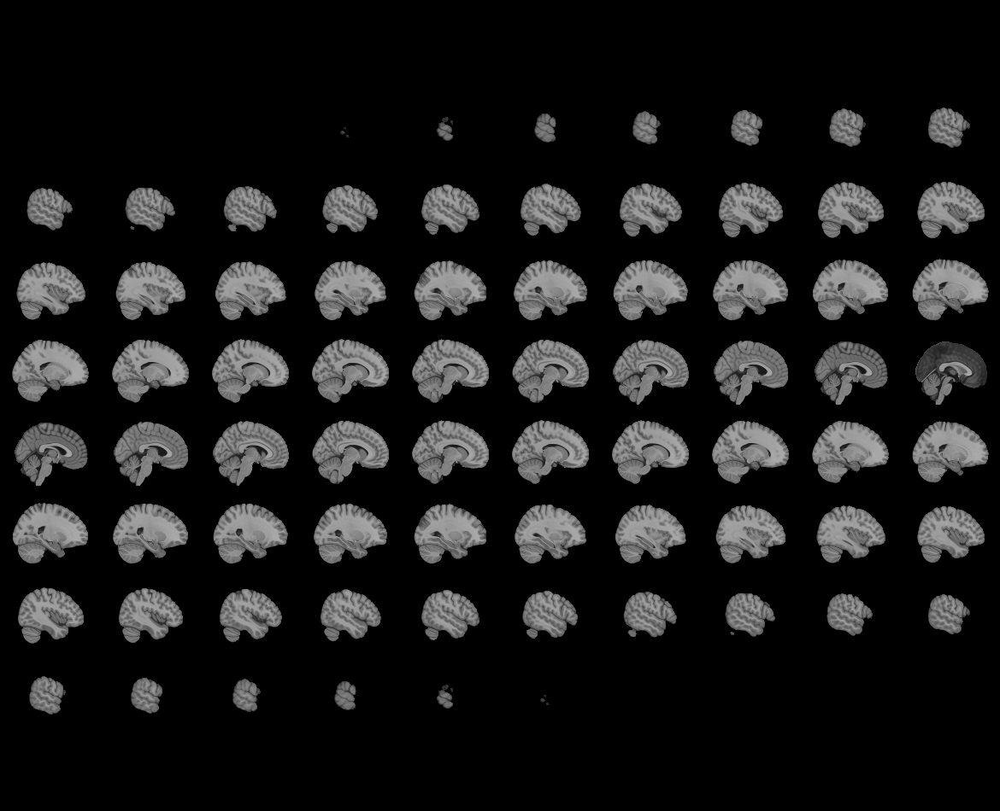
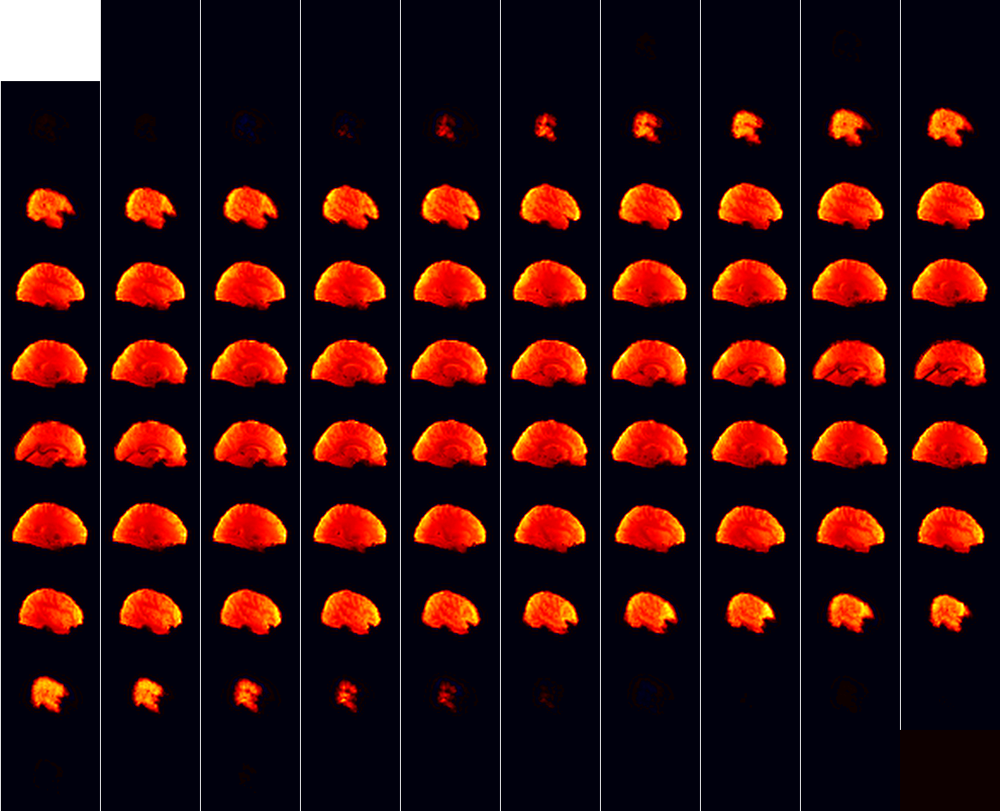

In [7]:
import matplotlib.pyplot as plt
from nilearn import image
from nilearn import plotting
mean_image = image.mean_img(development_dataset.func[0])
plotting.view_img(mean_image, threshold=None)


**Choosing regions of interest**

In [8]:
import numpy as np
msdl_atlas = datasets.fetch_atlas_msdl()
msdl_coords = msdl_atlas.region_coords
n_regions = len(msdl_coords)
print(f'MSDL has {n_regions} ROIs, part of the following networks :\n{np.unique(msdl_atlas.networks)}.')


Dataset created in /root/nilearn_data/msdl_atlas

MSDL has 39 ROIs, part of the following networks :
['Ant IPS' 'Aud' 'Basal' 'Cereb' 'Cing-Ins' 'D Att' 'DMN' 'Dors PCC'
 'L V Att' 'Language' 'Motor' 'Occ post' 'R V Att' 'Salience' 'Striate'
 'Temporal' 'Vis Sec'].


 ...done. (2 seconds, 0 min)
Extracting data from /root/nilearn_data/msdl_atlas/8eaecb9e05c478f565847000d9902a25/MSDL_rois.zip..... done.


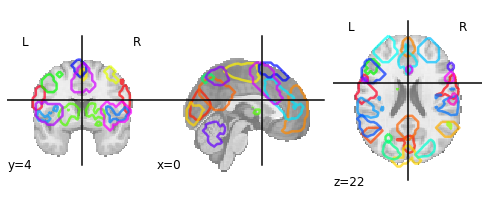

In [9]:

plotting.plot_prob_atlas(msdl_atlas.maps)

**Applying a Masker object**

In [10]:
from nilearn import input_data
masker = input_data.NiftiMapsMasker(
 msdl_atlas.maps, resampling_target="data",
 t_r=2, detrend=True,
 low_pass=0.1, high_pass=0.01).fit()

**Dimensions, dimensions**

In [11]:
roi_time_series = masker.transform(development_dataset.func[0])
roi_time_series.shape

(168, 39)

**Creating and viewing a connectome**

In [12]:
from nilearn.connectome import ConnectivityMeasure
correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrix = correlation_measure.fit_transform([roi_time_series])[0]


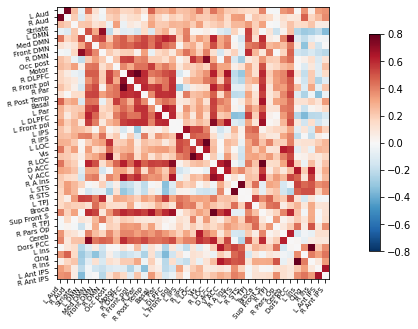

In [13]:
np.fill_diagonal(correlation_matrix, 0)
plotting.plot_matrix(correlation_matrix, labels=msdl_atlas.labels,
 vmax=0.8, vmin=-0.8, colorbar=True)


In [14]:
plotting.view_connectome(correlation_matrix, edge_threshold=0.2,node_coords=msdl_atlas.region_coords)

**Accounting for noise sources**

In [15]:
import pandas as pd
pd.read_table(development_dataset.confounds[0]).head()


,trans_x,trans_y,trans_z,rot_x,rot_y,rot_z,framewise_displacement,a_comp_cor_00,a_comp_cor_01,a_comp_cor_02,a_comp_cor_03,a_comp_cor_04,a_comp_cor_05,csf,white_matter
0,-0.000233,-0.076885,0.062321,0.000732,0.000352,0.000841,0.000000,-0.099871,-0.007286,0.001780,-0.008073,0.030945,-0.022393,439.699409,451.645460
1,-0.006187,-0.078395,0.056773,0.000112,0.000187,0.000775,0.055543,-0.019437,-0.042308,0.016735,-0.012099,0.088777,-0.006171,439.471640,451.103437
2,-0.000227,-0.069893,0.083102,0.000143,0.000364,0.000716,0.054112,0.009096,-0.053206,-0.030388,-0.052925,0.019922,0.014776,439.744498,450.981505
3,0.002492,-0.074707,0.060337,0.000202,0.000818,0.000681,0.057667,0.060195,-0.083195,0.003578,-0.037011,0.026946,0.002505,440.772620,450.600261
4,-0.000226,-0.084204,0.085079,0.000183,0.000548,0.000682,0.051438,0.049833,-0.089819,-0.020825,-0.079329,0.008516,-0.000938,440.115442,450.678959


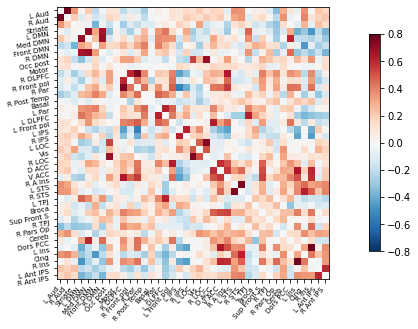

In [17]:
corrected_roi_time_series = masker.transform(
 development_dataset.func[0], confounds=development_dataset.confounds[0])
corrected_correlation_matrix = correlation_measure.fit_transform(
 [corrected_roi_time_series])[0]
np.fill_diagonal(corrected_correlation_matrix, 0)
plotting.plot_matrix(corrected_correlation_matrix, labels=msdl_atlas.labels,
 vmax=0.8, vmin=-0.8, colorbar=True)

In [18]:
plotting.view_connectome(corrected_correlation_matrix, edge_threshold=0.2,
 node_coords=msdl_atlas.region_coords)


**Load brain development fMRI dataset and MSDL atlas**


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import (datasets, input_data, plotting)
from nilearn.connectome import ConnectivityMeasure
development_dataset = datasets.fetch_development_fmri(n_subjects=30)
msdl_atlas = datasets.fetch_atlas_msdl()
masker = input_data.NiftiMapsMasker(
 msdl_atlas.maps, resampling_target="data",
 t_r=2, detrend=True,
 low_pass=0.1, high_pass=0.01).fit()
correlation_measure = ConnectivityMeasure(kind='correlation')

**Region signals extraction**


In [22]:
children = []
pooled_subjects = []
groups = [] # child or adult
for func_file, confound_file, phenotypic in zip(
 development_dataset.func,
 development_dataset.confounds,
 development_dataset.phenotypic):

  time_series = masker.transform(func_file, confounds=confound_file)
  pooled_subjects.append(time_series)
  if phenotypic['Child_Adult'] == 'child':
    children.append(time_series)
  groups.append(phenotypic['Child_Adult'])
print('Data has {0} children.'.format(len(children)))

Data has 24 children.


In [24]:
print(pooled_subjects[0].shape)

(168, 39)


**ROI-to-ROI correlations of children**

In [25]:
correlation_matrices = correlation_measure.fit_transform(children)

In [26]:
print('Correlations of children are stacked in an array of shape {0}'
 .format(correlation_matrices.shape))


Correlations of children are stacked in an array of shape (24, 39, 39)


In [27]:
mean_correlation_matrix = correlation_measure.mean_
print('Mean correlation has shape {0}.'.format(mean_correlation_matrix.shape))

Mean correlation has shape (39, 39).


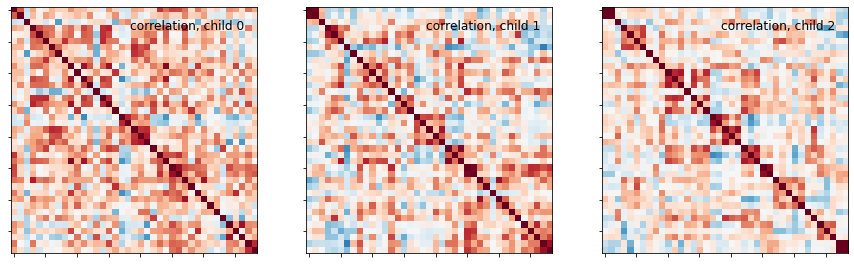

In [28]:
_, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, (matrix, ax) in enumerate(zip(correlation_matrices, axes)):
 plotting.plot_matrix(matrix, colorbar=False, axes=ax,
 vmin=-0.8, vmax=0.8,
 title='correlation, child {}'.format(i))

In [29]:
plotting.view_connectome(mean_correlation_matrix, msdl_atlas.region_coords,
 edge_threshold=0.2,
title='mean connectome over all children')

**Studying partial correlation**

In [30]:
partial_correlation_measure = ConnectivityMeasure(kind='partial correlation')
partial_correlation_matrices = partial_correlation_measure.fit_transform(
 children)

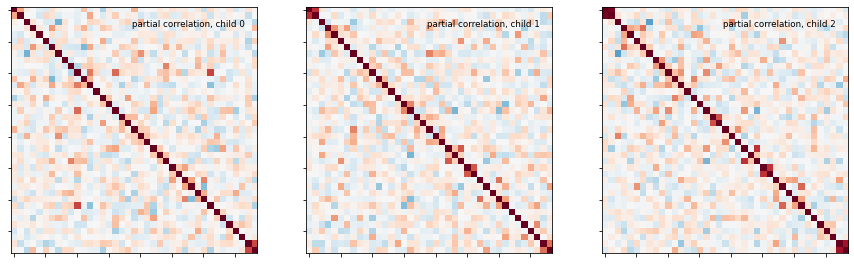

In [31]:
_, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, (matrix, ax) in enumerate(zip(partial_correlation_matrices, axes)):
 plotting.plot_matrix(matrix, colorbar=False, axes=ax,
 vmin=-0.8, vmax=0.8,
 title='partial correlation, child {}'.format(i))


In [32]:
plotting.view_connectome(
 partial_correlation_measure.mean_, msdl_atlas.region_coords,
 edge_threshold=0.2,
 title='mean partial correlation over all children')


**Using tangent space embedding**

In [33]:
tangent_measure = ConnectivityMeasure(kind='tangent')

In [34]:
tangent_matrices = tangent_measure.fit_transform(children)

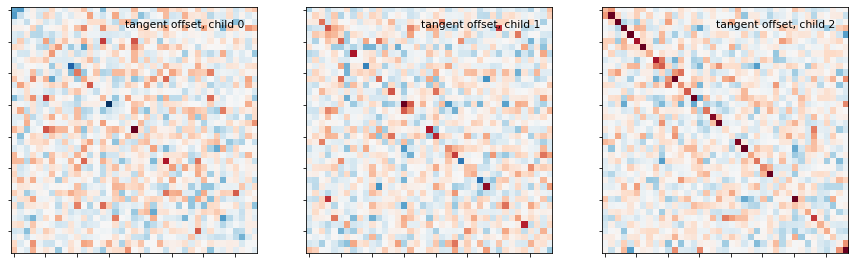

In [35]:
_, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, (matrix, ax) in enumerate(zip(tangent_matrices, axes)):
 plotting.plot_matrix(matrix, colorbar=False, axes=ax,
 vmin=-0.8, vmax=0.8,
 title='tangent offset, child {}'.format(i))

**Using connectivity in a classification analysis**

In [36]:

from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.svm import LinearSVC
kinds = ['correlation', 'partial correlation', 'tangent']
_, classes = np.unique(groups, return_inverse=True)
cv = StratifiedShuffleSplit(n_splits=15, random_state=0, test_size=5)
pooled_subjects = np.asarray(pooled_subjects)

In [38]:
scores = {}
for kind in kinds:
  scores[kind] = []
  for train, test in cv.split(pooled_subjects, classes):
 # *ConnectivityMeasure* can output the estimated subjects coefficients
 # as a 1D arrays through the parameter *vectorize*.
    connectivity = ConnectivityMeasure(kind=kind, vectorize=True)
 # build vectorized connectomes for subjects in the train set
    connectomes = connectivity.fit_transform(pooled_subjects[train])
 # fit the classifier
    classifier = LinearSVC().fit(connectomes, classes[train])
 # make predictions for the left-out test subjects
    predictions = classifier.predict(
    connectivity.transform(pooled_subjects[test]))
 # store the accuracy for this cross-validation fold
    scores[kind].append(accuracy_score(classes[test], predictions))

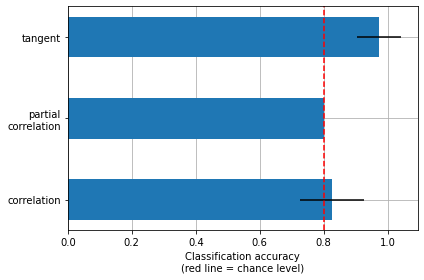

In [40]:
mean_scores = [np.mean(scores[kind]) for kind in kinds]
scores_std = [np.std(scores[kind]) for kind in kinds]
plt.figure(figsize=(6, 4))
positions = np.arange(len(kinds)) * .1 + .1
plt.barh(positions, mean_scores, align='center', height=.05, xerr=scores_std)
yticks = [k.replace(' ', '\n') for k in kinds]
plt.yticks(positions, yticks)
plt.gca().grid(True)
plt.gca().set_axisbelow(True)
plt.gca().axvline(.8, color='red', linestyle='--')
plt.xlabel('Classification accuracy\n(red line = chance level)')
plt.tight_layout()